** **
# **Embryonic snRNAseq Bioinformatics Tutorial**

- Bioinformatics adapted from __[NBISweden](NBIsweden.github.io/workshop-scRNAseq/exercises.html)__, via Leiden University, 2021

- Stage 10.5 single nucleus RNAseq data (Parse technology), unpublished from the Ken Cho Lab

 






** **
# __Overview__

Section 1) Preprocessing & Quality Control

Section 2) Linear & non-linear dimension reduction techniques

Section 3) Surveying Marker Gene Expression & Doublet Validation

Section 4) Clustering algorithms and Gene Expression based Annotation

Section 5) Differential Gene Expression Analysis


** **

# __Section 1: Preprocessing & Quality Control__

 __Topics__
- Loading data and background software
- Filtering genes/cell
- Filtering cells with abberant mitochondrial and ribosomal gene expression
- Doublet filtering
- Data normalization
- Accounting for batch effects
- Calling highly variable genes
- Regression

** **
 

__Part 1: Loading background software and data__

In [1]:
#Load background software

import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib
#import mnnpy
import scrublet as scr

In [2]:
sc.settings.verbosity = 0   # 0 = errors only
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
#Set scanpy settings for visualizations

sc.settings.verbosity = 2 #Scanpy verbosity reporting
sc.settings.set_figure_params(dpi=50) #Figure pixel resolution settings

__Upload our Stage 10 expression matrix and meta data__

In [4]:
#Upload stage specific read data

adataR = sc.read_h5ad('C:/Users/coron/OneDrive/Desktop/snRNAseq/St10/PARSE-WTSt105-Unfiltered_FromSeurat.h5ad')
adataR

AnnData object with n_obs × n_vars = 215209 × 21821
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'bc_wells', 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_well', 'bc2_well', 'bc3_well', 'bc1_wind', 'bc2_wind', 'bc3_wind'
    var: 'features'

In [5]:
#Visualize features our annotated dataframe
adataR.obs

,orig.ident,nCount_RNA,nFeature_RNA,bc_wells,sample,species,gene_count,tscp_count,mread_count,bc1_well,bc2_well,bc3_well,bc1_wind,bc2_wind,bc3_wind
01_01_01__s1,0,37.0,36,01_01_01__s1,all-well,xenopus,36,37,77,A1,A1,A1,1,1,1
01_01_02__s1,0,1630.0,1006,01_01_02__s1,all-well,xenopus,1006,1630,4438,A1,A1,A2,1,1,2
01_01_03__s1,0,20.0,19,01_01_03__s1,all-well,xenopus,19,20,47,A1,A1,A3,1,1,3
01_01_04__s1,0,17.0,17,01_01_04__s1,all-well,xenopus,17,17,34,A1,A1,A4,1,1,4
01_01_05__s1,0,85.0,80,01_01_05__s1,all-well,xenopus,80,85,232,A1,A1,A5,1,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12_96_90__s2,11,138.0,125,12_96_90__s2,all-well,xenopus,125,138,390,A12,H12,H6,12,96,90
12_96_91__s2,11,26.0,25,12_96_91__s2,all-well,xenopus,25,26,70,A12,H12,H7,12,96,91
12_96_92__s2,11,3585.0,1685,12_96_92__s2,all-well,xenopus,1685,3585,9690,A12,H12,H8,12,96,92
12_96_93__s2,11,63.0,62,12_96_93__s2,all-well,xenopus,62,63,168,A12,H12,H9,12,96,93


__Part 1: Filtering by cells/gene and genes/cell__

In [6]:
# Filter background barcodes

sc.pp.filter_cells(adataR, min_genes=1000) #Remove cells expressing less than 200 genes

#I personally don't remove lowly expressed genes until after I see clustering.
#There may be a cluster with 50 or fewer cells which I don't want to arbitrarily exclude.

#sc.pp.filter_genes(adataR, min_cells=50) #Remove genes who are expressed in 50 or fewer cells

print(adataR.n_obs, adataR.n_vars) #How many cells and genes pass QC

filtered out 199289 cells that have less than 1000 genes expressed
15920 21821


In [7]:
adataR

AnnData object with n_obs × n_vars = 15920 × 21821
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'bc_wells', 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_well', 'bc2_well', 'bc3_well', 'bc1_wind', 'bc2_wind', 'bc3_wind', 'n_genes'
    var: 'features'

** **
__Part 2: Investigating and filtering mitochondrial and ribosomal reads from cells__

Typically in single Cell RNAseq:
- High percentages (>20%) of Mitochondrial reads indicate stressed and dying cells
- Low percentages (<3.5%) of Ribosomal reads indicate transcriptionally silent cells

__However, in single nuclei RNAseq we do not expect to recover appreciable amount of ribosomal or mitochondrial reads.__




__Denote Ribosomal and Mitochondrial genes within the dataset and calculate their abundance metrics__

C:\Users\coron\miniconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\coron\miniconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\coron\miniconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\coron\miniconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is

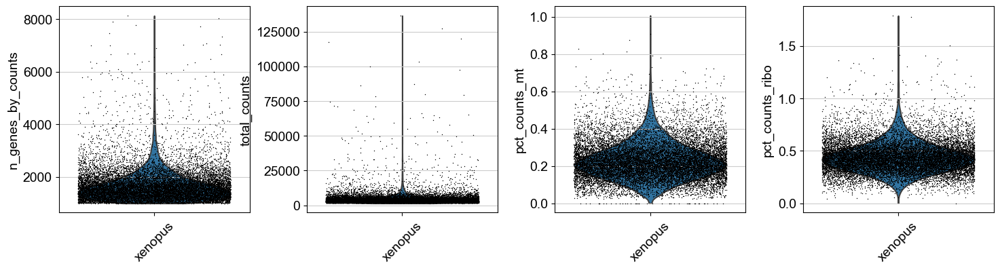

In [8]:
# Specifically label mitochondrial genes within the matrix
adataR.var['mt'] = adataR.var_names.str.startswith(('cox', 'COX', 'ND', 'rnr1', "a1bg", 'mrp', 'atp6', 'atp8', 'cyb5b',
                                                   'cyb5b', 'cytb', 'gfm1', 'gfm2', 'mrm2', 'mrm3', 'mief1', 'mief2', 'mrrf', 'mss51',
                                                   'mterf', 'mtfr', 'mtg', 'mtif', 'mtrf', 'mt-', 'timm', 'atp5m', 'atp5f', 'atp5p',
                                                   'slc25a20', 'slc25a26', 'slc25a27', 'slc25a28', 'slc25a30', 'slc25a34', 'slc25a36'))


# Specifically label ribosomal genes within the matrix
adataR.var['ribo'] = adataR.var_names.str.startswith(("rps","rpl"))


#Calculate "mt" and "ribo" percentage of count metrics
sc.pp.calculate_qc_metrics(adataR, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)


#Plot our "mt" and "ribo" percent metrics
sc.pl.violin(adataR, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],
             jitter=0.4, groupby = "species", rotation= 45)

__Remove cells with abberant mitochondrial and ribosomal count proportions__

In [9]:
#Remove cells with >20% mitochondrial read count percentage
#adataR = adataR[adataR.obs['pct_counts_mt'] < 20, :]

# Remove cells with <5% ribosomal read count percentage
#adataR = adataR[adataR.obs['pct_counts_ribo'] > 3.5, :]

print("Remaining cells %d"%adataR.n_obs)

Remaining cells 15920


** **
__Part 3: Predicting and filtering Doublets__

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.20
Detected doublet rate = 11.4%
Estimated detectable doublet fraction = 71.6%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 16.0%
Elapsed time: 21.3 seconds


1820

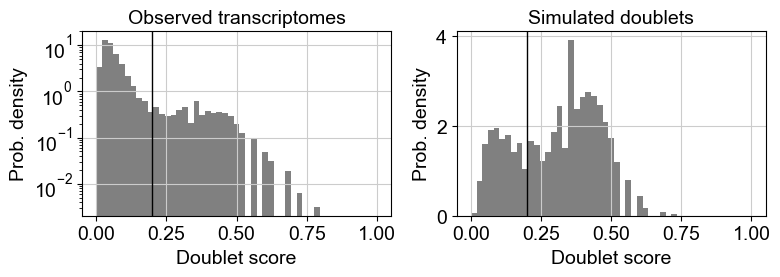

In [10]:
adataR.raw = adataR
scrub = scr.Scrublet(adataR.raw.X)
adataR.obs['doublet_scores'], adataR.obs['predicted_doublets'] = scrub.scrub_doublets()
scrub.plot_histogram()

sum(adataR.obs['predicted_doublets'])

In [11]:
# add in column with singlet/doublet instead of True/False

adataR.obs['doublet_info'] = adataR.obs["predicted_doublets"].astype(str)

__Visualize the estimated doublet proportion of the dataset__

C:\Users\coron\miniconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\coron\miniconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\coron\miniconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


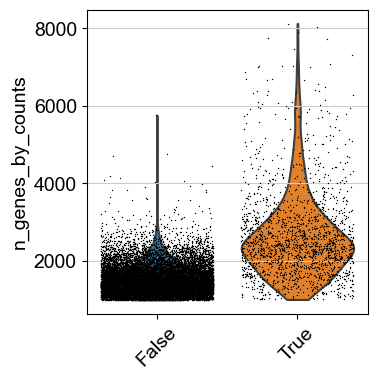

In [12]:
#Plot doublets vs singlets to reveal relative doublet abundance

sc.pl.violin(adataR, 'n_genes_by_counts',
             jitter=0.4, groupby = 'doublet_info', rotation=45)




__So the question is... to remove, or not to remove doublets from the dataset?__

__In my opinion, before you remove your doublets it's best to double check the doublet prediction by visualizing known marker gene expression!__

Rationalization: If a cell expresses multiple markers from distinct tissue types it's probably a doublet.

** **
__Part 4: Additional pre-processing, calling Highly Variable Genes and correcting for batch effects__

__Normalization__

In [13]:
# normalize to depth of 10,000 counts/cell
sc.pp.normalize_per_cell(adataR, counts_per_cell_after=1e4)

# logaritmize
sc.pp.log1p(adataR)


# store normalized counts in the raw slot, 
# we will subset adata.X for variable genes, but want to keep all genes matrix as well.
adataR.raw = adataR

adataR

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


AnnData object with n_obs × n_vars = 15920 × 21821
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'bc_wells', 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_well', 'bc2_well', 'bc3_well', 'bc1_wind', 'bc2_wind', 'bc3_wind', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'doublet_info', 'n_counts'
    var: 'features', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'species_colors', 'doublet_info_colors', 'log1p'

__Distinguish Highly Variable Genes__

extracting highly variable genes
    finished (0:00:00)


C:\Users\coron\miniconda3\Lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


Highly variable genes: 6439


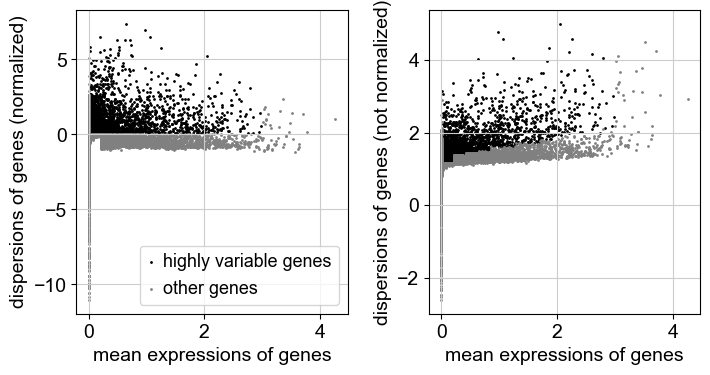

In [14]:
# compute variable genes
sc.pp.highly_variable_genes(adataR, min_mean=0.0125, max_mean=3, min_disp=0.05)
print("Highly variable genes: %d"%sum(adataR.var.highly_variable))

#plot variable genes
sc.pl.highly_variable_genes(adataR)

# subset for variable genes in the dataset
adataR = adataR[:, adataR.var['highly_variable']]

__Conduct library Batch Corrections using MNN software (FYI)__

We only have a single sequencing library for Stage 10.5, however if you did have multiple sequencing libraries then you could perform batch corrections.

In the example code below, the batch key called "lib_name" is a column of adataR2.obs where the row identifiers were "Library_17", "Library_18", "Library_19", etc

For you to run this code using your data, you need to change the column "lib_name" to your library column name, and the "Library_17"-"Library_22" identifiers to your row identifiers.

__Utilize regression to eliminate impact of mitochondrial counts__

I'm not implementing it here because we have so few mitochondrial counts, however FYI

In [15]:
# Utilize linear regression to decrease effect of differential or unwanted variables
#sc.pp.regress_out(adataR, ['pct_counts_mt'])

** **
** **

# __Section 2: Linear and Non-linear dimension reduction analysis__

 __Topics__
- Principle Component Analysis (PCA)
- t-Stochastic Neighbor Embedding (tSNE)
- Uniform Manifold Approximation Projection (UMAP)

** **
 

__Part 1: Linear Dimension Reduction: Principle Component Analysis (PCA)__

__Calculate PCA__

In [16]:
# Perform PCA on our pre-processed data

sc.tl.pca(adataR, svd_solver='arpack', n_comps=100)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:09)


__Visualize top PCA components__

- During PCA, components are ranked in descending order of variance explained.
- Here, covariance is derived from comparing a cell's differential expression compared to other cells across the dataset.
- Generally, genes that are the most highly expressed and differentially expressed will contribute the most variance.

C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a

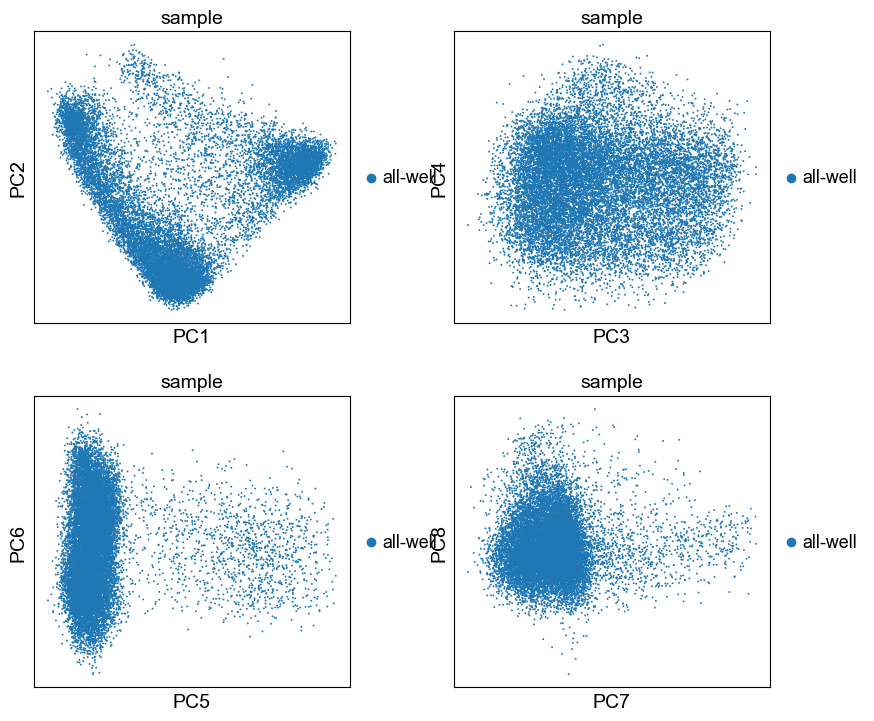

In [17]:
# Investigate specific principle components

sc.pl.pca(adataR, color='sample', components = ['1,2','3,4','5,6','7,8'], ncols=2) #components comparisons can be changed to your liking

__Visualize the variance contributed by each Principle Component__

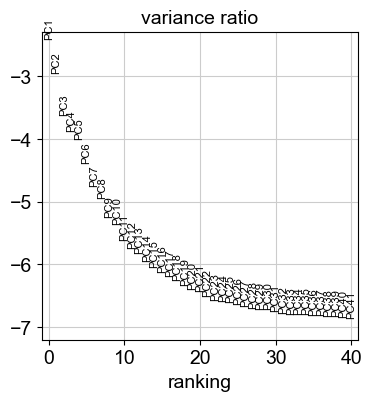

In [18]:
#Investigate the variance explained by each Principle Coordinate
sc.pl.pca_variance_ratio(adataR, log=True, n_pcs = 40)


__Visualize the PCA loadings__

- Principle component loadings reveal the genes which contribute most to variance of each component

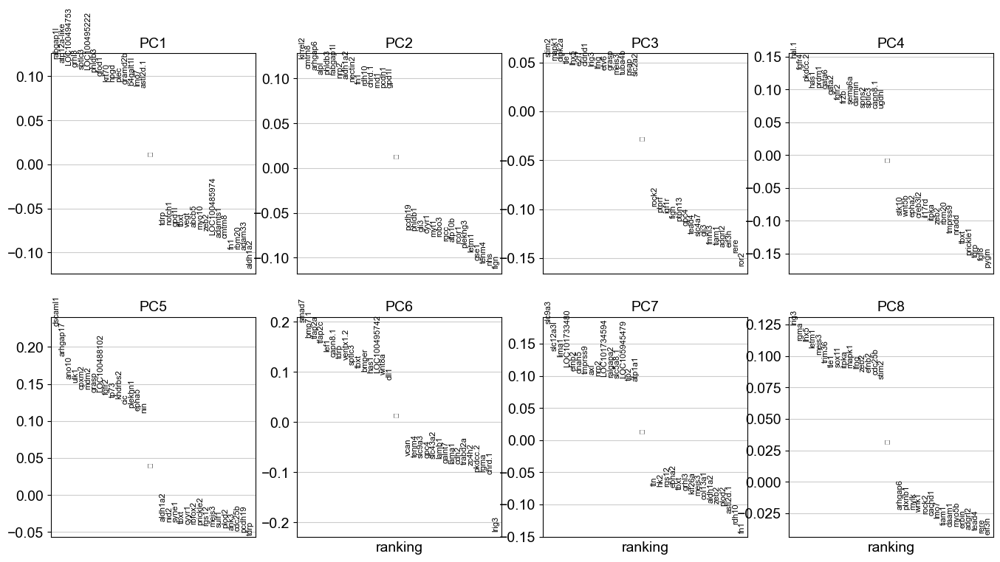

In [19]:
#Plot loadings
sc.pl.pca_loadings(adataR, components=[1,2,3,4,5,6,7,8])

** **
__Part 2: Non-linear Dimension Reduction: t-Stochastic Neighbor Embedding (tSNE)__

__Compute tSNE__

In [20]:
sc.tl.tsne(adataR, n_pcs = 30)

#This can be run using different n_pcs which varies the number of principle components used in the analysis

computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE
    finished (0:00:54)


__Visualize tSNE__

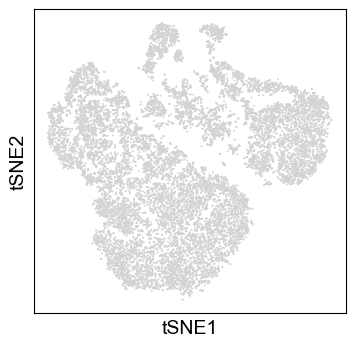

In [21]:
sc.pl.tsne(adataR)

__Try varying the number of components used to educate tSNE, and see how it effects the embeddings__

In [22]:
#Change the n_pcs = (X) parameter and see the effect
sc.tl.tsne(adataR, n_pcs = 99) #Here I have changed to 8 principle components

computing tSNE
    using 'X_pca' with n_pcs = 99
    using sklearn.manifold.TSNE
    finished (0:00:59)


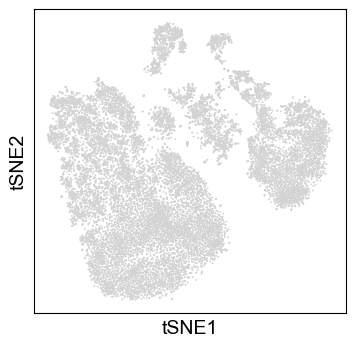

In [23]:
#Plot your varied components tSNE
sc.pl.tsne(adataR)
#This can be run using different n_pcs which varies the number of principle components used in the analysis

** **
__Part 3: Non-linear Dimension Reduction: Uniform Manifold Approximation Projection (UMAP)__

__Calculate UMAP__

You can modulate your UMAP output by selecting different parameters of principal coordinate (n_pcs) and nearest neighbors (n_neighbors)

- Increasing n_pcs incorporates more components that explain less variance.
- Increasing n_neighbors causes each cell to consider additional neighbors when placing itself in the plot.

computing neighbors
    using 'X_pca' with n_pcs = 10


C:\Users\coron\miniconda3\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished (0:00:28)
computing UMAP
    finished (0:00:10)


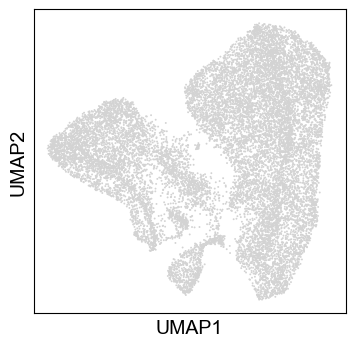

In [24]:
#Calculate a neighborhood graph based on principle components and some number of nearest neighbors to consider
sc.pp.neighbors(adataR, n_pcs = 10, n_neighbors = 50)

#Compute machine learning using UMAP algorithm combined with our data set and our neighborhood graph calculated from the previous step
sc.tl.umap(adataR, n_components=2)

#Plot the UMAP
sc.pl.umap(adataR)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished (0:00:02)
computing UMAP
    finished (0:00:10)


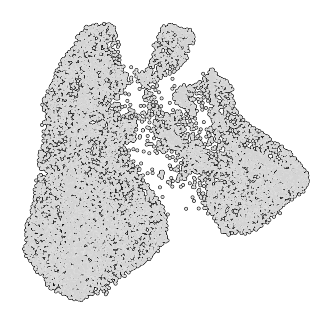

In [25]:
sc.pp.neighbors(adataR, n_pcs = 20, n_neighbors = 50)
sc.tl.umap(adataR, n_components=2)
sc.pl.umap(adataR, frameon=False, size=10, add_outline=True)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:02)
computing UMAP
    finished (0:00:10)


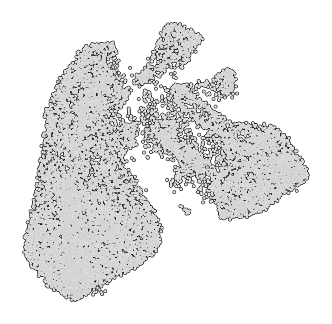

In [26]:
sc.pp.neighbors(adataR, n_pcs = 50, n_neighbors = 50)
sc.tl.umap(adataR, n_components=2)
sc.pl.umap(adataR, frameon=False, size=10, add_outline=True)

computing neighbors
    using 'X_pca' with n_pcs = 99
    finished (0:00:03)
computing UMAP
    finished (0:00:10)


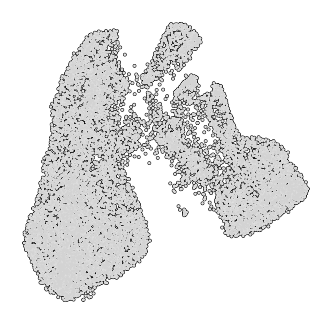

In [27]:
sc.pp.neighbors(adataR, n_pcs = 99, n_neighbors = 50)
sc.tl.umap(adataR, n_components=2)
sc.pl.umap(adataR, frameon=False, size=10, add_outline=True)

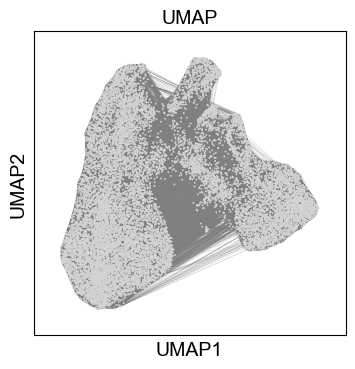

In [28]:
# we can also plot the umap with neighbor edges
sc.pl.umap(adataR, title="UMAP", edges=True)

** **

# __Section 3: Surveying Marker Gene Expression & Doublet Validation__

 __Topics__
- Visualizing the localization of known germ layer differentiating marker genes
- Marker gene expression helps us validate doublet predictions

** **
 

__Part 1: Visualizing germ layer marker genes__

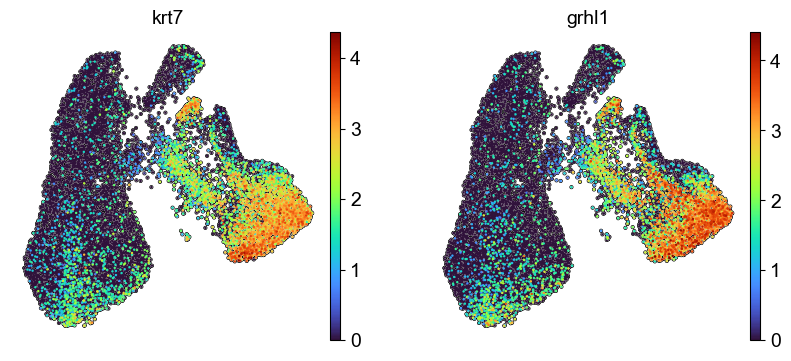

In [29]:
#Epidermal Markers Markers
gene_list=['krt7', 'grhl1']
sc.pl.umap(adataR, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, )

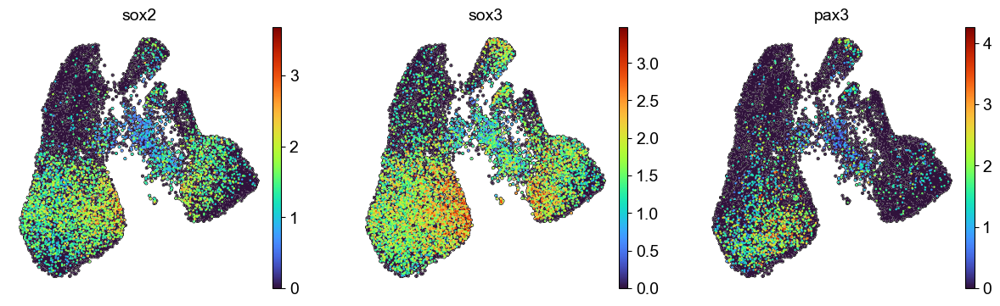

In [30]:
#Neuroectoderm Markers
gene_list=['sox2', 'sox3', 'pax3']
sc.pl.umap(adataR, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, )

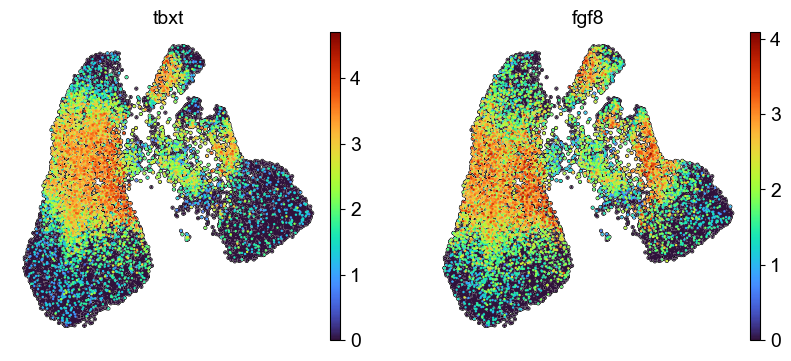

In [31]:
#Mesodermal Markers Markers
gene_list=['tbxt', 'fgf8']
sc.pl.umap(adataR, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, )

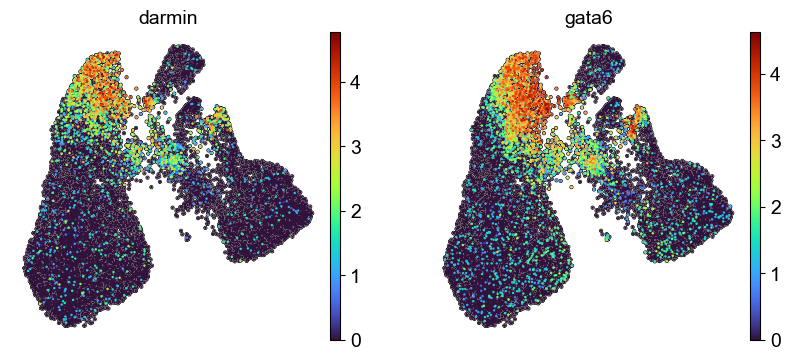

In [32]:
#Endodermal Markers Markers
gene_list=['darmin', 'gata6']
sc.pl.umap(adataR, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, )

__Part 2: Validating doublet predictions__

C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


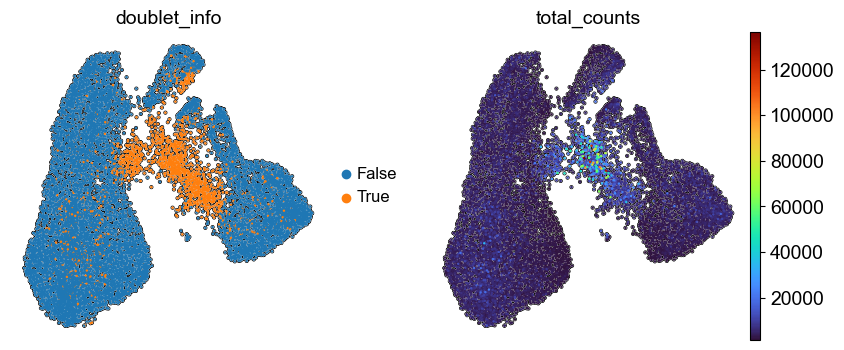

In [33]:
#Predicted Doublets
sc.pl.umap(adataR, color=["doublet_info", 'total_counts'],  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, )

__Removing predicted doublets__

In [34]:
# Remove doublets from our data
adataR = adataR.raw.to_adata()  # also revert back to the raw counts as the main matrix in adata

adataR = adataR[adataR.obs['doublet_info'] == 'False',:]
print(adataR.shape)

(14100, 21821)


C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


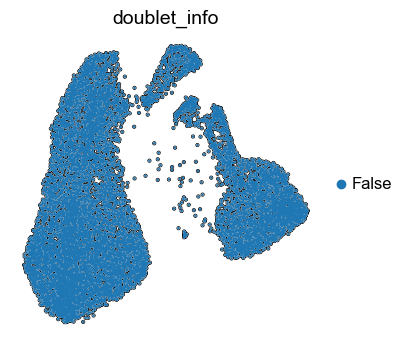

In [35]:
#Predicted Doublets
sc.pl.umap(adataR, color="doublet_info",  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, )

__Re-running UMAP clustering without doublet influence__

computing neighbors
    using 'X_pca' with n_pcs = 99
    finished (0:00:02)
computing UMAP
    finished (0:00:10)


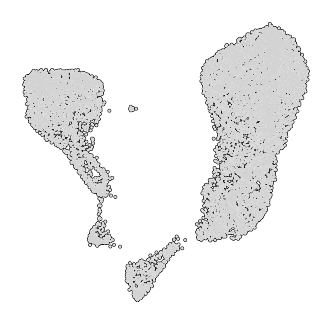

In [36]:
sc.pp.neighbors(adataR, n_pcs = 99, n_neighbors = 50)
sc.tl.umap(adataR, n_components=2)
sc.pl.umap(adataR, frameon=False, size=10, add_outline=True)

** **

# __Section 4: Clustering algorithms and Gene Expression based Annotation__

 __Topics__
- Leiden clustering algorithm
- Subsetting clusters & annotating cells based on Marker Gene threshold Expression

** **
 

__Part 1: Utilize the Leiden algorithm for broadly annotating cell clusters__

__Choose your Leiden resolution and run the algorithm on our adataR's manifold projection (UMAP)__

In [37]:
sc.tl.leiden(adataR, key_added = "leiden_1.0") # default resolution in 1.0
sc.tl.leiden(adataR, resolution = 0.1, key_added = "leiden_0.1")
sc.tl.leiden(adataR, resolution = 0.3, key_added = "leiden_0.3")
sc.tl.leiden(adataR, resolution = 0.8, key_added = "leiden_0.8")
sc.tl.leiden(adataR, resolution = 1.2, key_added = "leiden_1.2")
sc.tl.leiden(adataR, resolution = 10.0, key_added = "leiden_10.0")


running Leiden clustering
    finished (0:00:05)
running Leiden clustering
    finished (0:00:03)
running Leiden clustering
    finished (0:00:03)
running Leiden clustering
    finished (0:00:03)
running Leiden clustering
    finished (0:00:03)
running Leiden clustering
    finished (0:00:06)


__Visualize the different Leiden resolutions__

C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a

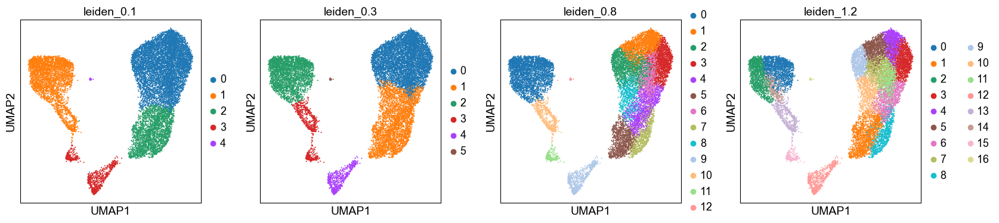

In [38]:
sc.pl.umap(adataR, color=['leiden_0.1', 'leiden_0.3',  'leiden_0.8', 'leiden_1.2'])

C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


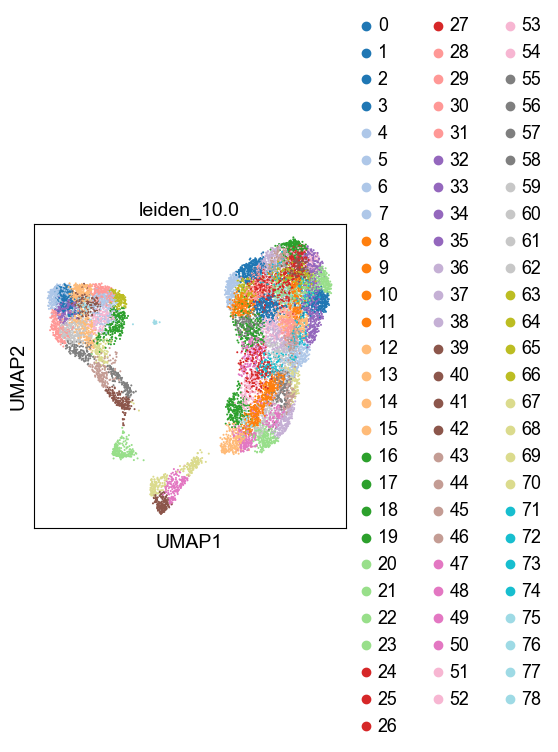

In [39]:
sc.pl.umap(adataR, color=['leiden_10.0'], palette="tab20")

__Part 2: Subsetting and Expression Based Annotation of leiden_0.1 - cluster "1"__

__First we subset cluster "1" from leiden_0.1__

In [40]:
# Subset the AnnData object to include only cells with the "1" annotation in the leiden_0.1 column
adata_1 = adataR[adataR.obs['leiden_0.1'] == '1'].copy()

# adata_1 now contains only the cells with a "1" annotation in the leiden_0.1 column


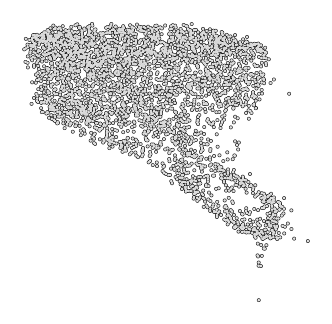

In [41]:
sc.pl.umap(adata_1, frameon=False, size=10, add_outline=True)

__Confirming Epidermal, Neuroectodermal, Mesodermal and Endodermal Marker expression__

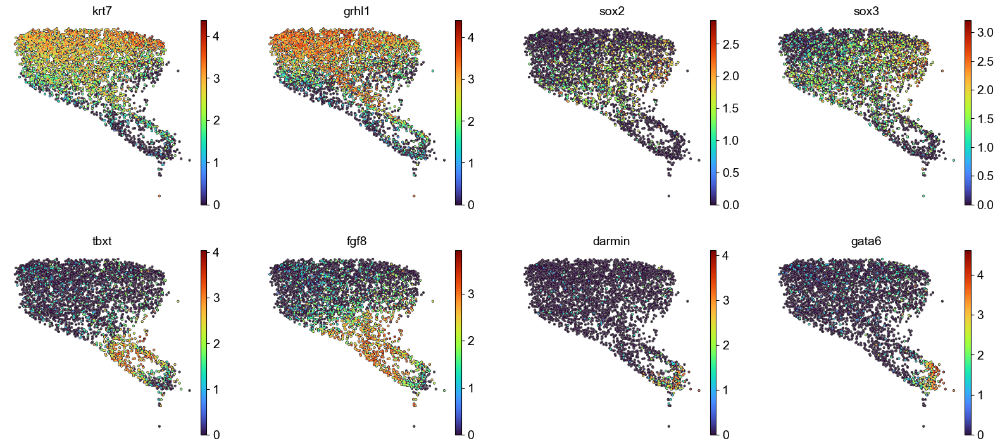

In [42]:
#Markers Expression Check
gene_list=['krt7', 'grhl1', 'sox2', 'sox3', 'tbxt', 'fgf8', 'darmin', 'gata6']
sc.pl.umap(adata_1, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, )

__Annotating cell's based on a threshold of marker gene expression__

C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


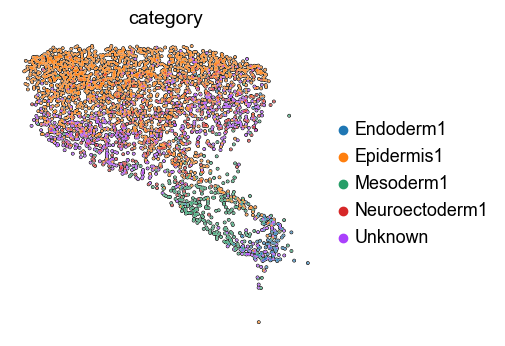

In [43]:
import numpy as np

# Define a function to categorize cells based on gene expression
def categorize_cells(adata, gene_pairs):
    # Initialize a new column for the cell categories
    adata.obs['category'] = 'Unknown'
    
    for category, genes in gene_pairs.items():
        # Initialize a mask with False values
        mask = np.ones(len(adata), dtype=bool)
        
        for gene in genes:
            # Update the mask to include cells that meet the expression threshold for each gene
            mask = mask & (adata[:, gene].X.toarray().flatten() > .5)
        
        # Assign the category to cells that meet the criteria
        adata.obs.loc[mask, 'category'] = category

# Define the gene expression criteria for each category
gene_pairs = {
    'Mesoderm1': ['tbxt', 'fgf8'],
    'Epidermis1': ['krt7', 'grhl1'],
    'Neuroectoderm1': ['sox2', 'sox3'],
    'Endoderm1': ['darmin', 'gata6']
}

# Apply the categorization function to your data
categorize_cells(adata_1, gene_pairs)

# Now you can plot the UMAP with cells colored by their assigned category
sc.pl.umap(adata_1, color='category', frameon=False, size=10, add_outline=True)


__Performing an additional Knn calculation on annotation labels to eliminate the "Unknown" annotation__

C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


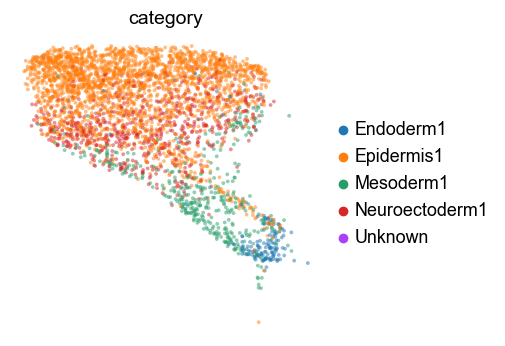

In [44]:
# First, ensure neighbors are computed and UMAP is available
if 'neighbors' not in adata_1.uns:
    sc.pp.neighbors(adata_1, n_neighbors=10, use_rep='X_pca')
if 'X_umap' not in adata_1.obsm:
    sc.tl.umap(adata_1)

# Convert 'Unknown' indices to integer positions
unknown_idx_positions = adata_1.obs_names.get_indexer(adata_1.obs[adata_1.obs['category'] == 'Unknown'].index)

# Get the KNN graph
knn_graph = adata_1.obsp['connectivities']

# Update categories for 'Unknown' cells based on their nearest labeled neighbor
for idx_pos in unknown_idx_positions:
    # Find nonzero entries (neighbors) in the row corresponding to the 'Unknown' cell
    neighbors = knn_graph[idx_pos].nonzero()[1]
    
    for neighbor_pos in neighbors:
        # Translate neighbor position back to an index label
        neighbor_index = adata_1.obs_names[neighbor_pos]
        neighbor_category = adata_1.obs.loc[neighbor_index, 'category']
        if neighbor_category != 'Unknown':
            # Assign the category of the nearest labeled neighbor to the 'Unknown' cell
            adata_1.obs.iat[idx_pos, adata_1.obs.columns.get_loc('category')] = neighbor_category
            break  # Exit the loop after finding the first labeled neighbor

# Plot the UMAP with updated categories
sc.pl.umap(adata_1, color='category', frameon=False, size=30, add_outline=False, alpha=.5)

__Recombine our annotated subsetted data with our original adataR UMAP under the column "category"__

In [45]:
# Assuming 'category' is the column in adata_1.obs with updated annotations
# and you want to update or add a corresponding column in adataR.obs

# First, check if 'category' column exists in adataR.obs; if not, create it
if 'category' not in adataR.obs.columns:
    adataR.obs['category'] = 'Unknown'  # Initialize with 'Unknown' or another placeholder

# Update the 'category' in adataR based on annotations in adata_1
# This loop goes through each cell in adata_1 and updates the corresponding cell in adataR
for cell_id in adata_1.obs_names:
    # Here we assume that cell_id is directly usable to index adataR.obs; adjust if necessary
    if cell_id in adataR.obs_names:
        adataR.obs.at[cell_id, 'category'] = adata_1.obs.at[cell_id, 'category']

# At this point, adataR has been updated with the 'category' annotations from adata_1


C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


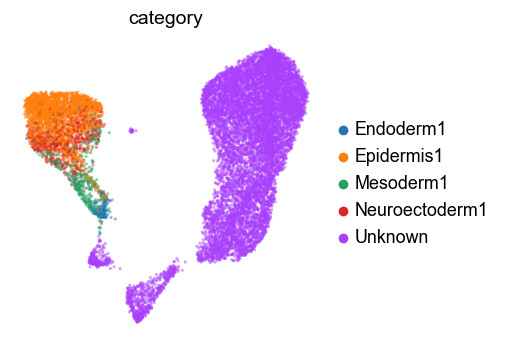

In [46]:
sc.pl.umap(adataR, color=['category'], frameon=False, size=20, add_outline=False, alpha=.5)

C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


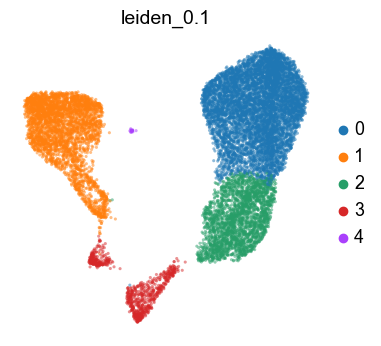

In [47]:
sc.pl.umap(adataR, color='leiden_0.1', frameon=False, size=20, add_outline=False, alpha=.5)

__Part 3: Subsetting and Expression Based Annotation of leiden_0.1 - cluster "2"__

__Subset cluster 2 from leiden_0.1__

In [48]:
# Subset the AnnData object to include only cells with the "2" annotation in the leiden_0.1 column
adata_2 = adataR[adataR.obs['leiden_0.1'] == '2'].copy()

# adata_2 now contains only the cells with a "2" annotation in the leiden_0.1 column


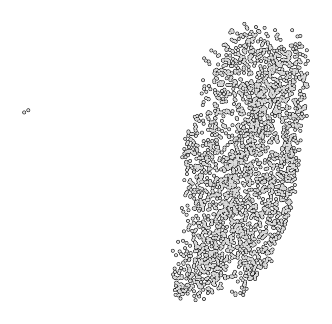

In [49]:
sc.pl.umap(adata_2, frameon=False, size=10, add_outline=True)

__Confirming Epidermal, Neuroectodermal, Mesodermal and Endodermal Marker expression__

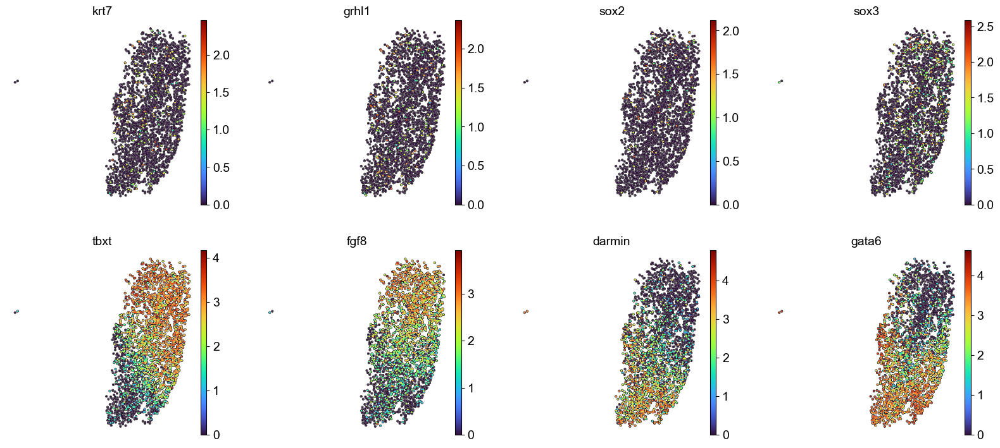

In [50]:
#Markers Expression Check
gene_list=['krt7', 'grhl1', 'sox2', 'sox3', 'tbxt', 'fgf8', 'darmin', 'gata6']
sc.pl.umap(adata_2, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, )

__Annotating cell's based on a threshold of marker gene expression__

C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


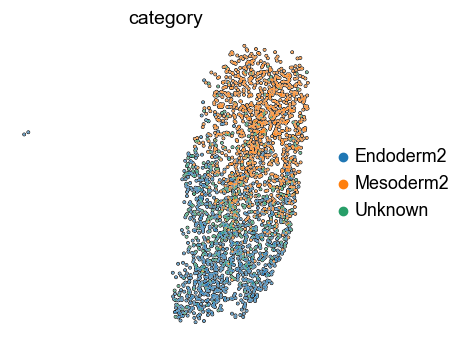

In [51]:
import numpy as np

# Define a function to categorize cells based on gene expression
def categorize_cells(adata, gene_pairs):
    # Initialize a new column for the cell categories
    adata.obs['category'] = 'Unknown'
    
    for category, genes in gene_pairs.items():
        # Initialize a mask with False values
        mask = np.ones(len(adata), dtype=bool)
        
        for gene in genes:
            # Update the mask to include cells that meet the expression threshold for each gene
            mask = mask & (adata[:, gene].X.toarray().flatten() > .5)
        
        # Assign the category to cells that meet the criteria
        adata.obs.loc[mask, 'category'] = category

# Define the gene expression criteria for each category
gene_pairs = {
    'Mesoderm2': ['tbxt', 'fgf8'],
    'Endoderm2': ['darmin', 'gata6']
}

# Apply the categorization function to your data
categorize_cells(adata_2, gene_pairs)

# Now you can plot the UMAP with cells colored by their assigned category
sc.pl.umap(adata_2, color='category', frameon=False, size=10, add_outline=True)


__Performing an additional Knn calculation on annotation labels to eliminate the "Unknown" annotation__

C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


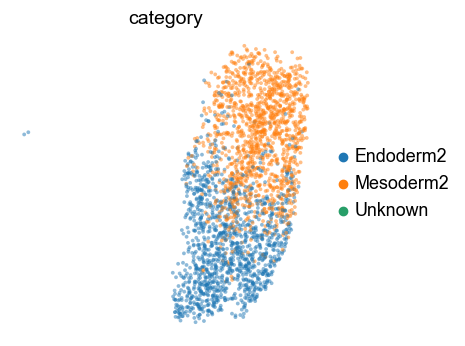

In [52]:
# First, ensure neighbors are computed and UMAP is available
if 'neighbors' not in adata_2.uns:
    sc.pp.neighbors(adata_2, n_neighbors=10, use_rep='X_pca')
if 'X_umap' not in adata_2.obsm:
    sc.tl.umap(adata_2)

# Convert 'Unknown' indices to integer positions
unknown_idx_positions = adata_2.obs_names.get_indexer(adata_2.obs[adata_2.obs['category'] == 'Unknown'].index)

# Get the KNN graph
knn_graph = adata_2.obsp['connectivities']

# Update categories for 'Unknown' cells based on their nearest labeled neighbor
for idx_pos in unknown_idx_positions:
    # Find nonzero entries (neighbors) in the row corresponding to the 'Unknown' cell
    neighbors = knn_graph[idx_pos].nonzero()[1]
    
    for neighbor_pos in neighbors:
        # Translate neighbor position back to an index label
        neighbor_index = adata_2.obs_names[neighbor_pos]
        neighbor_category = adata_2.obs.loc[neighbor_index, 'category']
        if neighbor_category != 'Unknown':
            # Assign the category of the nearest labeled neighbor to the 'Unknown' cell
            adata_2.obs.iat[idx_pos, adata_2.obs.columns.get_loc('category')] = neighbor_category
            break  # Exit the loop after finding the first labeled neighbor

# Plot the UMAP with updated categories
sc.pl.umap(adata_2, color='category', frameon=False, size=30, add_outline=False, alpha=.5)

__Recombine our annotated subsetted data with our original adataR UMAP under the column "category"__

In [53]:
# Extract unique categories from adata_2
new_categories_2 = adata_2.obs['category'].unique()

# Get the current categories in adataR
current_categories_R = adataR.obs['category'].cat.categories

# Filter out the new categories that already exist in adataR
categories_to_add = [cat for cat in new_categories_2 if cat not in current_categories_R]

# If there are new categories to add, update adataR.obs['category'] to include these new categories
if categories_to_add:
    adataR.obs['category'] = adataR.obs['category'].cat.add_categories(categories_to_add)

# Now proceed to update the 'category' in adataR based on annotations in adata_2
for cell_id in adata_2.obs_names:
    # Ensure the cell_id exists in adataR to avoid KeyErrors
    if cell_id in adataR.obs_names:
        # Update the category in adataR with the category from adata_2
        adataR.obs.at[cell_id, 'category'] = adata_2.obs.at[cell_id, 'category']


C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


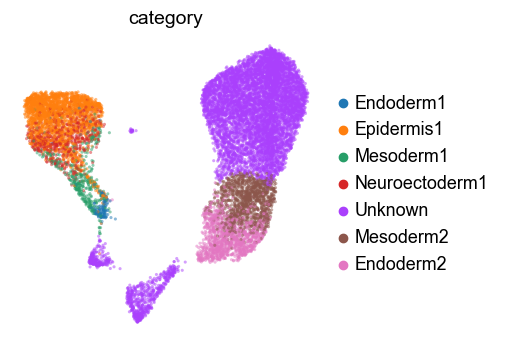

In [54]:
sc.pl.umap(adataR, color='category', frameon=False, size=20, add_outline=False, alpha=.5)

C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


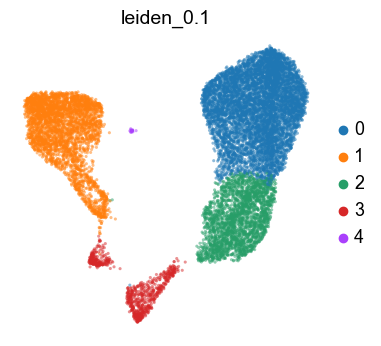

In [55]:
sc.pl.umap(adataR, color='leiden_0.1', frameon=False, size=20, add_outline=False, alpha=.5)

__Part 4: Subsetting and Expression Based Annotation of leiden_0.1 - cluster "0"__

__Subset cluster 0 from leiden_0.1__

In [56]:
# Subset the AnnData object to include only cells with the "0" annotation in the leiden_0.1 column
adata_0 = adataR[adataR.obs['leiden_0.1'] == '0'].copy()

# adata_0 now contains only the cells with a "0" annotation in the leiden_0.1 column


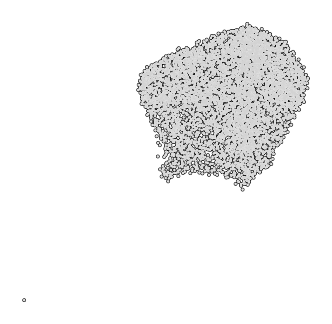

In [57]:
sc.pl.umap(adata_0, frameon=False, size=10, add_outline=True)

__Confirming Epidermal, Neuroectodermal, Mesodermal and Endodermal Marker expression__

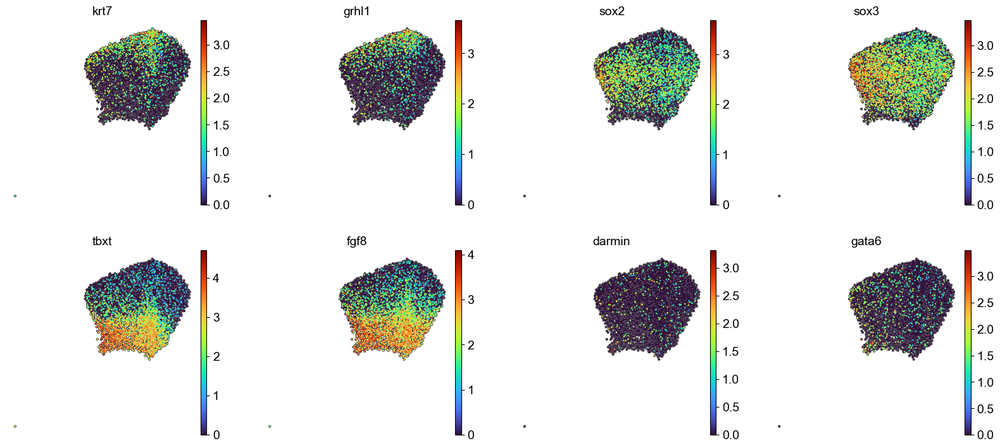

In [58]:
#Markers Expression Check
gene_list=['krt7', 'grhl1', 'sox2', 'sox3', 'tbxt', 'fgf8', 'darmin', 'gata6']
sc.pl.umap(adata_0, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, )

__Annotating cell's based on a threshold of marker gene expression__

C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


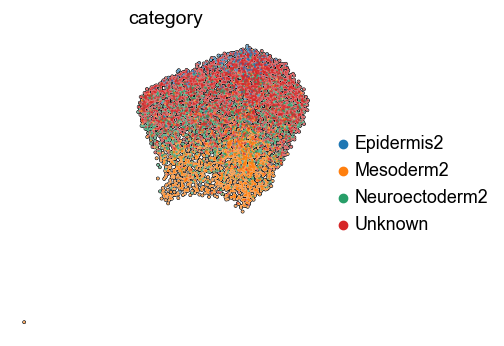

In [59]:
import numpy as np

# Define a function to categorize cells based on gene expression
def categorize_cells(adata, gene_pairs):
    # Initialize a new column for the cell categories
    adata.obs['category'] = 'Unknown'
    
    for category, genes in gene_pairs.items():
        # Initialize a mask with False values
        mask = np.ones(len(adata), dtype=bool)
        
        for gene in genes:
            # Update the mask to include cells that meet the expression threshold for each gene
            mask = mask & (adata[:, gene].X.toarray().flatten() > .5)
        
        # Assign the category to cells that meet the criteria
        adata.obs.loc[mask, 'category'] = category

# Define the gene expression criteria for each category
gene_pairs = {
    'Mesoderm2': ['tbxt', 'fgf8'],
    'Epidermis2': ['krt7', 'grhl1'],
    'Neuroectoderm2': ['sox2', 'sox3'],
}

# Apply the categorization function to your data
categorize_cells(adata_0, gene_pairs)

# Now you can plot the UMAP with cells colored by their assigned category
sc.pl.umap(adata_0, color='category', frameon=False, size=10, add_outline=True)


__Performing an additional Knn calculation on annotation labels to eliminate the "Unknown" annotation__

C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


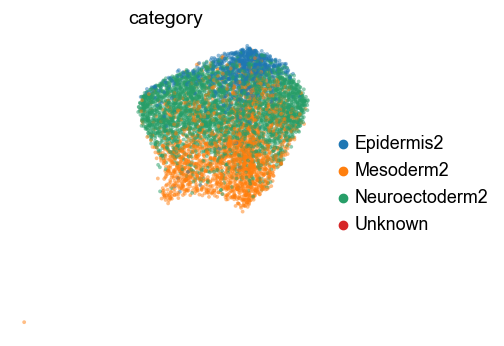

In [60]:
# First, ensure neighbors are computed and UMAP is available
if 'neighbors' not in adata_0.uns:
    sc.pp.neighbors(adata_0, n_neighbors=10, use_rep='X_pca')
if 'X_umap' not in adata_0.obsm:
    sc.tl.umap(adata_0)

# Convert 'Unknown' indices to integer positions
unknown_idx_positions = adata_0.obs_names.get_indexer(adata_0.obs[adata_0.obs['category'] == 'Unknown'].index)

# Get the KNN graph
knn_graph = adata_0.obsp['connectivities']

# Update categories for 'Unknown' cells based on their nearest labeled neighbor
for idx_pos in unknown_idx_positions:
    # Find nonzero entries (neighbors) in the row corresponding to the 'Unknown' cell
    neighbors = knn_graph[idx_pos].nonzero()[1]
    
    for neighbor_pos in neighbors:
        # Translate neighbor position back to an index label
        neighbor_index = adata_0.obs_names[neighbor_pos]
        neighbor_category = adata_0.obs.loc[neighbor_index, 'category']
        if neighbor_category != 'Unknown':
            # Assign the category of the nearest labeled neighbor to the 'Unknown' cell
            adata_0.obs.iat[idx_pos, adata_0.obs.columns.get_loc('category')] = neighbor_category
            break  # Exit the loop after finding the first labeled neighbor

# Plot the UMAP with updated categories
sc.pl.umap(adata_0, color='category', frameon=False, size=30, add_outline=False, alpha=.5)

__Recombine our annotated subsetted data with our original adataR UMAP under the column "category"__

In [61]:
# Extract unique categories from adata_0
new_categories_3 = adata_0.obs['category'].unique()

# Get the current categories in adataR
current_categories_R = adataR.obs['category'].cat.categories

# Filter out the new categories that already exist in adataR
categories_to_add = [cat for cat in new_categories_3 if cat not in current_categories_R]

# If there are new categories to add, update adataR.obs['category'] to include these new categories
if categories_to_add:
    adataR.obs['category'] = adataR.obs['category'].cat.add_categories(categories_to_add)

# Now proceed to update the 'category' in adataR based on annotations in adata_0
for cell_id in adata_0.obs_names:
    # Ensure the cell_id exists in adataR to avoid KeyErrors
    if cell_id in adataR.obs_names:
        # Update the category in adataR with the category from adata_3
        adataR.obs.at[cell_id, 'category'] = adata_0.obs.at[cell_id, 'category']


__Alphabetically order our categories__

In [62]:
# Ensure 'category' is a Categorical datatype
adataR.obs['category'] = adataR.obs['category'].astype('category')

# Sort the categories alphabetically
adataR.obs['category'] = adataR.obs['category'].cat.reorder_categories(sorted(adataR.obs['category'].cat.categories), ordered=True)

C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


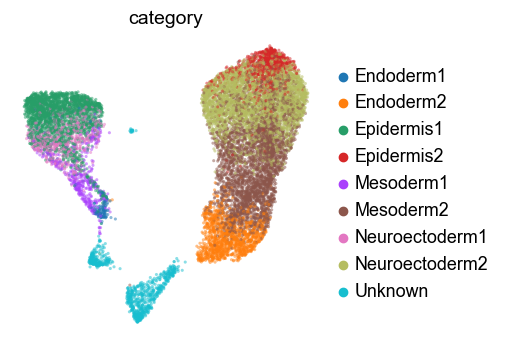

In [63]:
# Now, plot the UMAP
sc.pl.umap(adataR, color='category', frameon=False, size=20, add_outline=False, alpha=.5)


** **

# __Section 5: Differential Gene Expression Analysis__

 __Topics__
- Using statistical tests to call differential expression between all clusters
- Using statistical tests to call differential expression between two specific clusters

** **
 

__Part 1: Utilize T-test to calculate differential expression between clusters of our "category" annotation__
- Other statistical tests can also be used, like Wilcoxon, Student T-test, logistic regression, or T-test overestimated variance.

ranking genes
    finished (0:00:01)


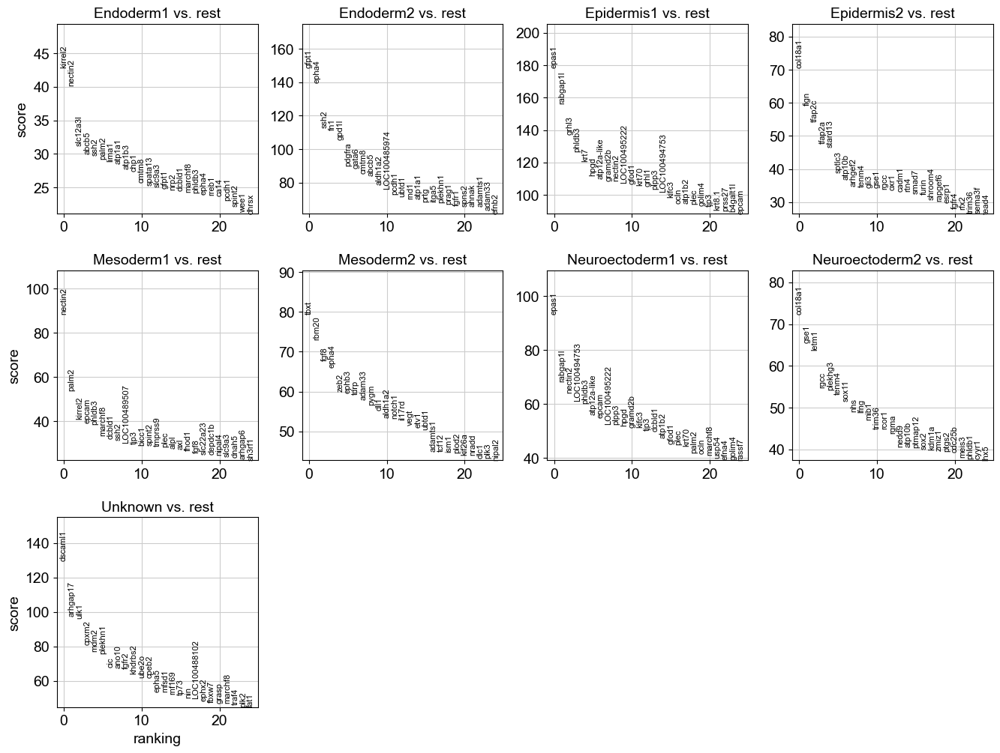

In [64]:
sc.tl.rank_genes_groups(adataR, 'category', method='t-test', key_added = "t-test")
sc.pl.rank_genes_groups(adataR, n_genes=25, sharey=False, key = "t-test")

__Part 2: Utilize T-test to calculate differential expression between specific clusters__
- Other statistical tests can also be used, like Wilcoxon, Student T-test, logistic regression, or T-test overestimated variance.

__Differential Expression between Mesoderm 1 and Mesoderm 2__

In [65]:
# Subset the AnnData object to include only cells annotated as "Mesoderm1" or "Mesoderm2"
adata_mesoderm = adataR[adataR.obs['category'].isin(['Mesoderm1', 'Mesoderm2'])].copy()

# adata_mesoderm now contains only the cells with a "Mesoderm1" or "Mesoderm2" annotation in the category column


C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


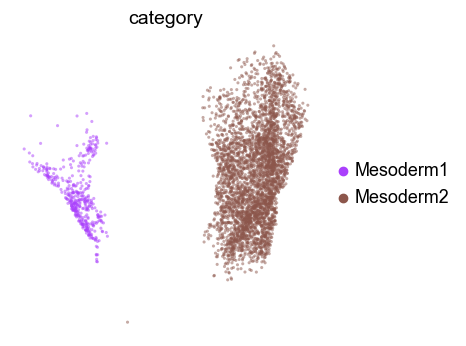

In [66]:
# Now, plot the UMAP
sc.pl.umap(adata_mesoderm, color='category', frameon=False, size=20, add_outline=False, alpha=.5)


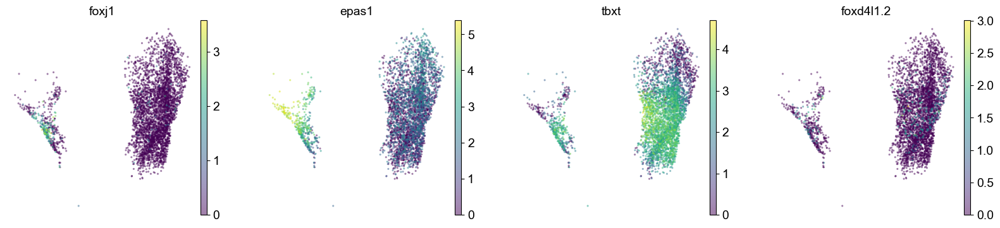

In [67]:
# Now, plot the UMAP
sc.pl.umap(adata_mesoderm, color=['foxj1', 'epas1', 'tbxt', 'foxd4l1.2'], frameon=False, size=20, add_outline=False, alpha=.5)


ranking genes
    finished (0:00:00)
ranking genes
    finished (0:00:00)


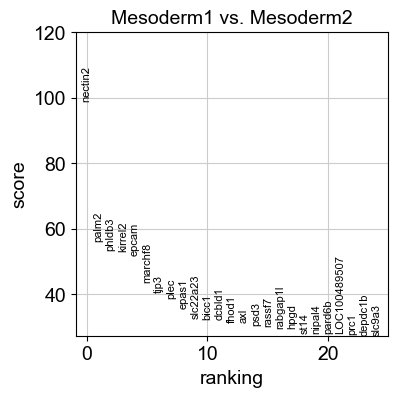

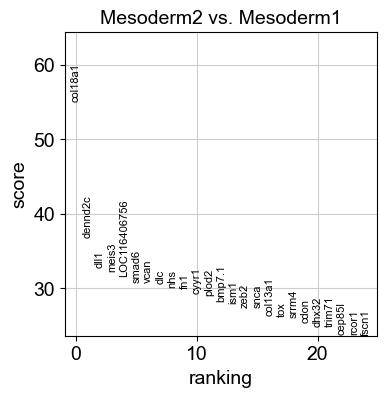

In [68]:
# Perform rank_genes_groups for comparing 'Mesoderm1' to 'Mesoderm2'
sc.tl.rank_genes_groups(adata_mesoderm, 'category', groups=['Mesoderm1'], reference='Mesoderm2', method='t-test', key_added="Mesoderm1_vs_Mesoderm2")
sc.tl.rank_genes_groups(adata_mesoderm, 'category', groups=['Mesoderm2'], reference='Mesoderm1', method='t-test', key_added="Mesoderm2_vs_Mesoderm1")

# Plot the ranked genes
sc.pl.rank_genes_groups(adata_mesoderm, n_genes=25, sharey=False, key="Mesoderm1_vs_Mesoderm2")
sc.pl.rank_genes_groups(adata_mesoderm, n_genes=25, sharey=False, key="Mesoderm2_vs_Mesoderm1")


    using 'X_pca' with n_pcs = 100
Storing dendrogram info using `.uns['dendrogram_category']`


C:\Users\coron\miniconda3\Lib\site-packages\scanpy\tools\_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()


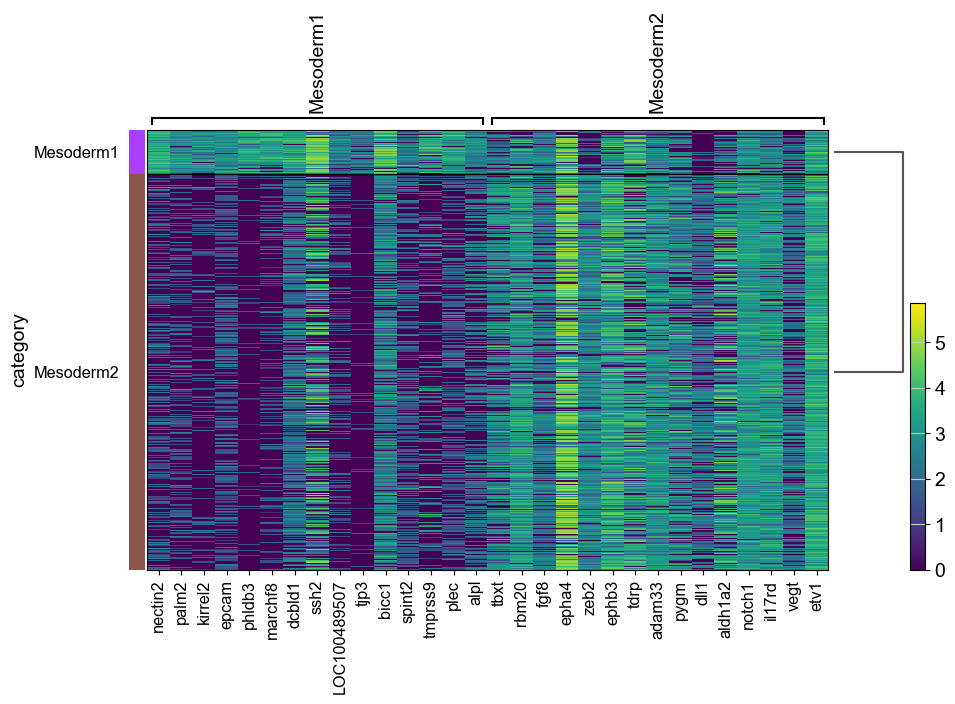

In [69]:
# Plot the heatmap for only 'Mesoderm1' and 'Mesoderm2' categories
sc.pl.rank_genes_groups_heatmap(adata_mesoderm, n_genes=15, key="t-test", 
                                groupby="category", groups=['Mesoderm1', 'Mesoderm2'], 
                                show_gene_labels=True)


C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_matrixplot.py:143: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()


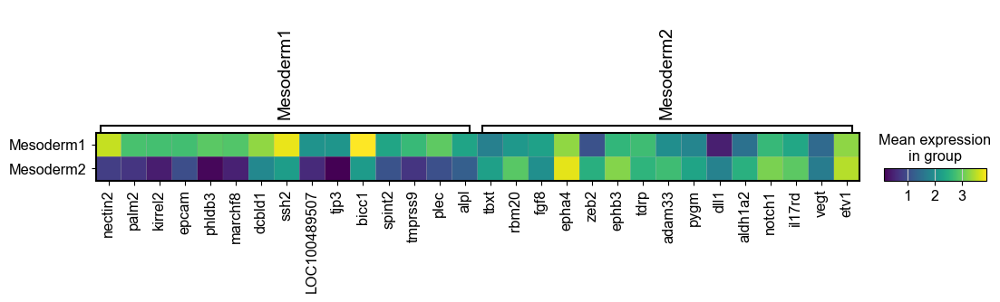

In [70]:
# Plot the heatmap for only 'Mesoderm1' and 'Mesoderm2' categories
sc.pl.rank_genes_groups_matrixplot(adata_mesoderm, n_genes=15, key="t-test", 
                                groupby="category", groups=['Mesoderm1', 'Mesoderm2'])


C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()


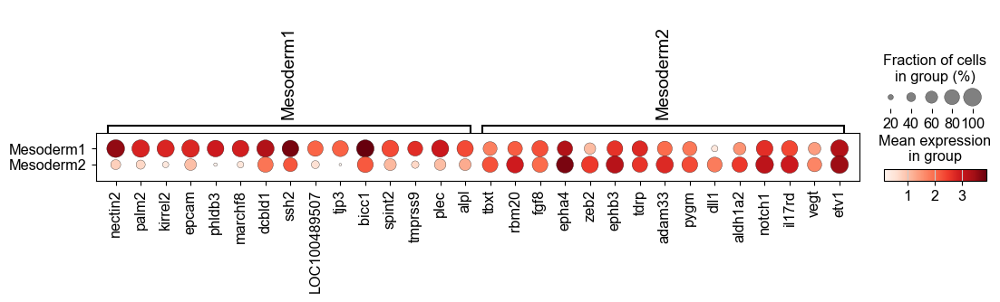

In [71]:
# Plot the heatmap for only 'Mesoderm1' and 'Mesoderm2' categories
sc.pl.rank_genes_groups_dotplot(adata_mesoderm, n_genes=15, key="t-test", 
                                groupby="category", groups=['Mesoderm1', 'Mesoderm2'])


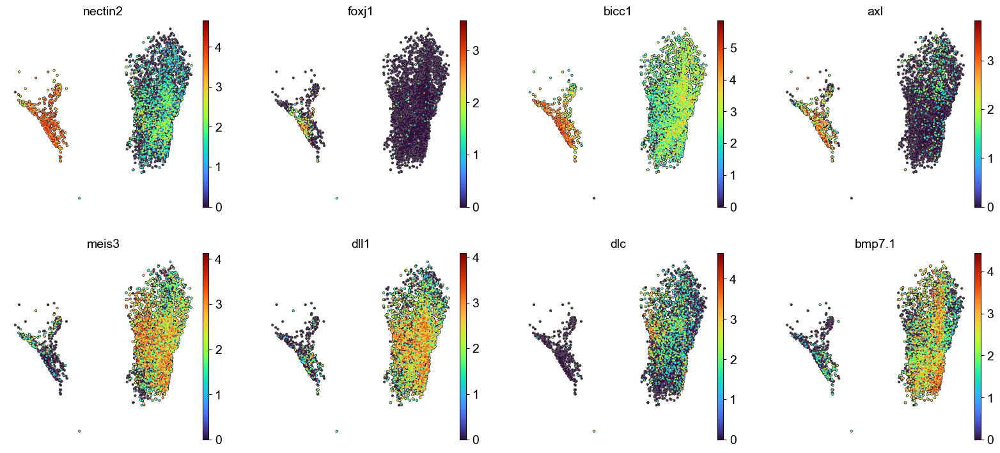

In [72]:
#Differentially Expressed Markers
gene_list=['nectin2', 'foxj1', 'bicc1', 'axl', 'meis3', 'dll1', 'dlc', 'bmp7.1']
sc.pl.umap(adata_mesoderm, color=gene_list,  color_map=plt.cm.turbo, add_outline=True, size=12, frameon=False, legend_fontsize=12, alpha=1, )

__Differential Expression between Epidermis 1 and Epidermis 2__

In [73]:
# Subset the AnnData object to include only cells annotated as "Epidermis1" or "Epidermis2"
adata_epidermis = adataR[adataR.obs['category'].isin(['Epidermis1', 'Epidermis2'])].copy()

# adata_mesoderm now contains only the cells with a "Epidermis1" or "Epidermis2" annotation in the category column


C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


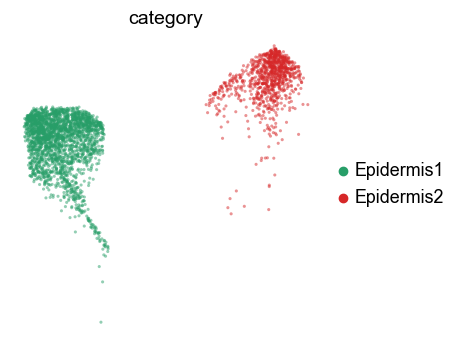

In [74]:
# Now, plot the UMAP
sc.pl.umap(adata_epidermis, color='category', frameon=False, size=20, add_outline=False, alpha=.5)

ranking genes
    finished (0:00:00)
ranking genes
    finished (0:00:00)


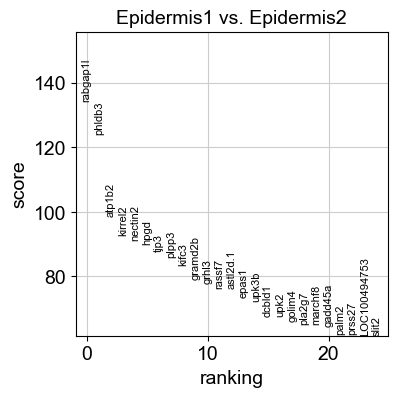

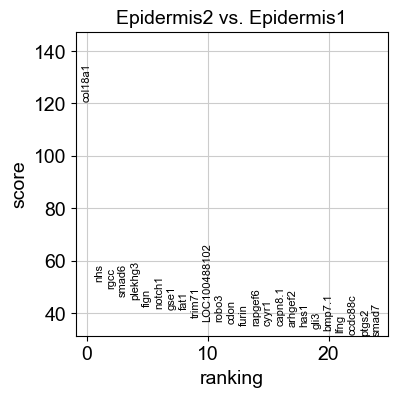

In [75]:
# Perform rank_genes_groups for comparing 'Mesoderm1' to 'Mesoderm2'
sc.tl.rank_genes_groups(adata_epidermis, 'category', groups=['Epidermis1'], reference='Epidermis2', method='t-test', key_added="Epidermis1_vs_Epidermis2")
sc.tl.rank_genes_groups(adata_epidermis, 'category', groups=['Epidermis2'], reference='Epidermis1', method='t-test', key_added="Epidermis2_vs_Epidermis1")

# Plot the ranked genes
sc.pl.rank_genes_groups(adata_epidermis, n_genes=25, sharey=False, key="Epidermis1_vs_Epidermis2")
sc.pl.rank_genes_groups(adata_epidermis, n_genes=25, sharey=False, key="Epidermis2_vs_Epidermis1")


    using 'X_pca' with n_pcs = 100
Storing dendrogram info using `.uns['dendrogram_category']`


C:\Users\coron\miniconda3\Lib\site-packages\scanpy\tools\_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()


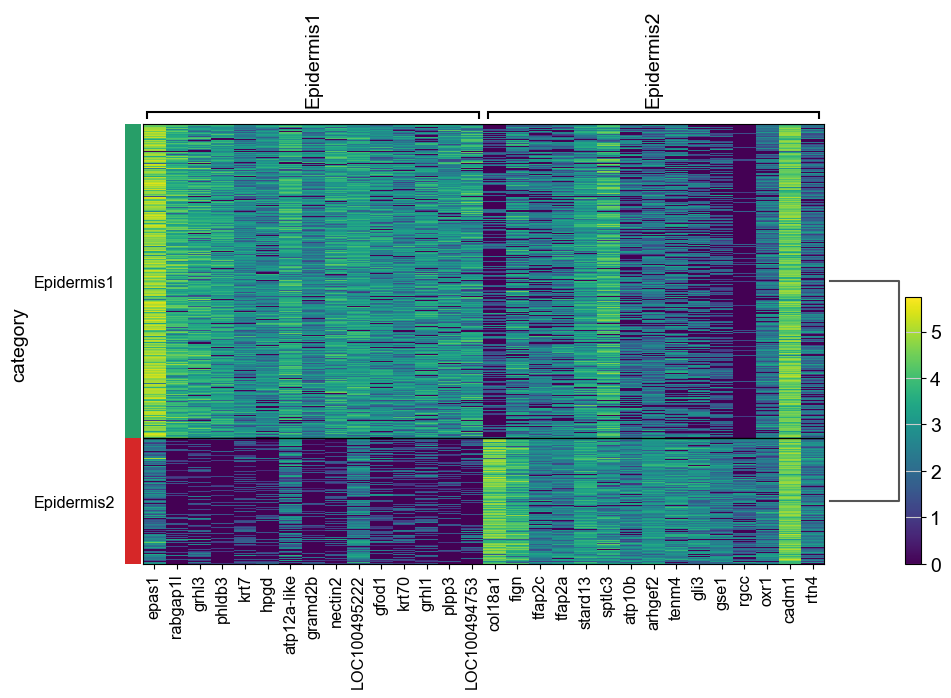

In [76]:
import scanpy as sc

# Plot the heatmap for only 'Epidermis1' and 'Epidermis2' categories
sc.pl.rank_genes_groups_heatmap(adata_epidermis, n_genes=15, key="t-test", 
                                groupby="category", groups=['Epidermis1', 'Epidermis2'], 
                                show_gene_labels=True)


C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_matrixplot.py:143: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()


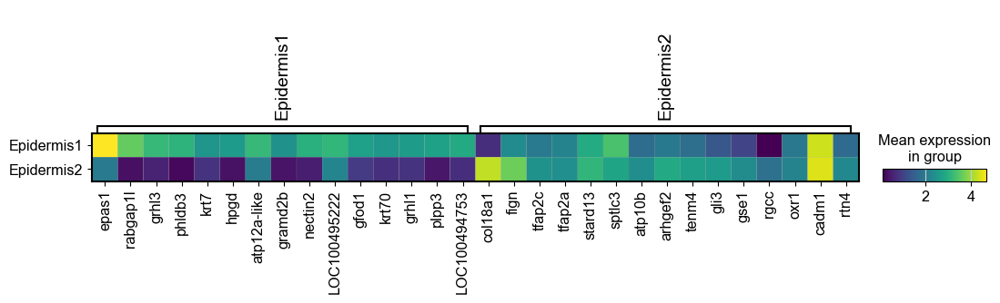

In [77]:
# Plot the heatmap for only 'Epidermis1' and 'Epidermis2' categories
sc.pl.rank_genes_groups_matrixplot(adata_epidermis, n_genes=15, key="t-test", 
                                groupby="category", groups=['Epidermis1', 'Epidermis2'])


C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\coron\miniconda3\Lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()


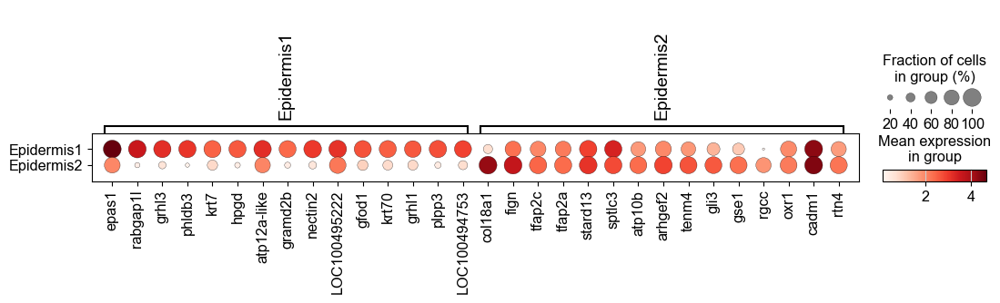

In [78]:
# Plot the heatmap for only 'Epidermis1' and 'Epidermis2' categories
sc.pl.rank_genes_groups_dotplot(adata_epidermis, n_genes=15, key="t-test", 
                                groupby="category", groups=['Epidermis1', 'Epidermis2'])
